In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fashion-product-images-dataset/fashion-dataset/images.csv
/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/31973.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/30778.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/19812.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/22735.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/38246.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/16916.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/52876.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/39500.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/44758.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/59454.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/44951.jp

In [5]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch import nn
import torchvision
from torchvision import datasets
import cv2
import joblib
from sklearn.metrics.pairwise import cosine_similarity
from pandas.core.common import flatten
from torchvision.transforms import transforms
import torchvision.models as models
from torch.autograd import Variable
from PIL import Image

In [6]:
fashion_data = pd.read_csv('/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv', on_bad_lines='skip')

In [4]:
fashion_copy = fashion_data.copy()

In [5]:
fashion_copy['image_path'] = fashion_copy.apply(lambda row: str(row['id']) + '.jpg', axis=1)
fashion_copy = fashion_copy.reset_index(drop=True)

In [6]:
def get_image_path(image_name):
    base_path = "/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/"
    full_path = base_path + image_name
    return full_path

In [7]:
# import an image
def load_image(image_name):
    image = cv2.imread(get_image_path(image_name))
    return image

In [8]:
# Display some images
def display_images(image_dict, rows=1, cols=1, figsize=(12, 12)):
    fig, axes = plt.subplots(ncols=cols, nrows=rows, figsize=figsize)
    
    for idx, name in enumerate(image_dict):
        axes.ravel()[idx].imshow(cv2.cvtColor(image_dict[name], cv2.COLOR_BGR2RGB))
        axes.ravel()[idx].set_title(name)
        axes.ravel()[idx].set_axis_off()
    
    plt.tight_layout()

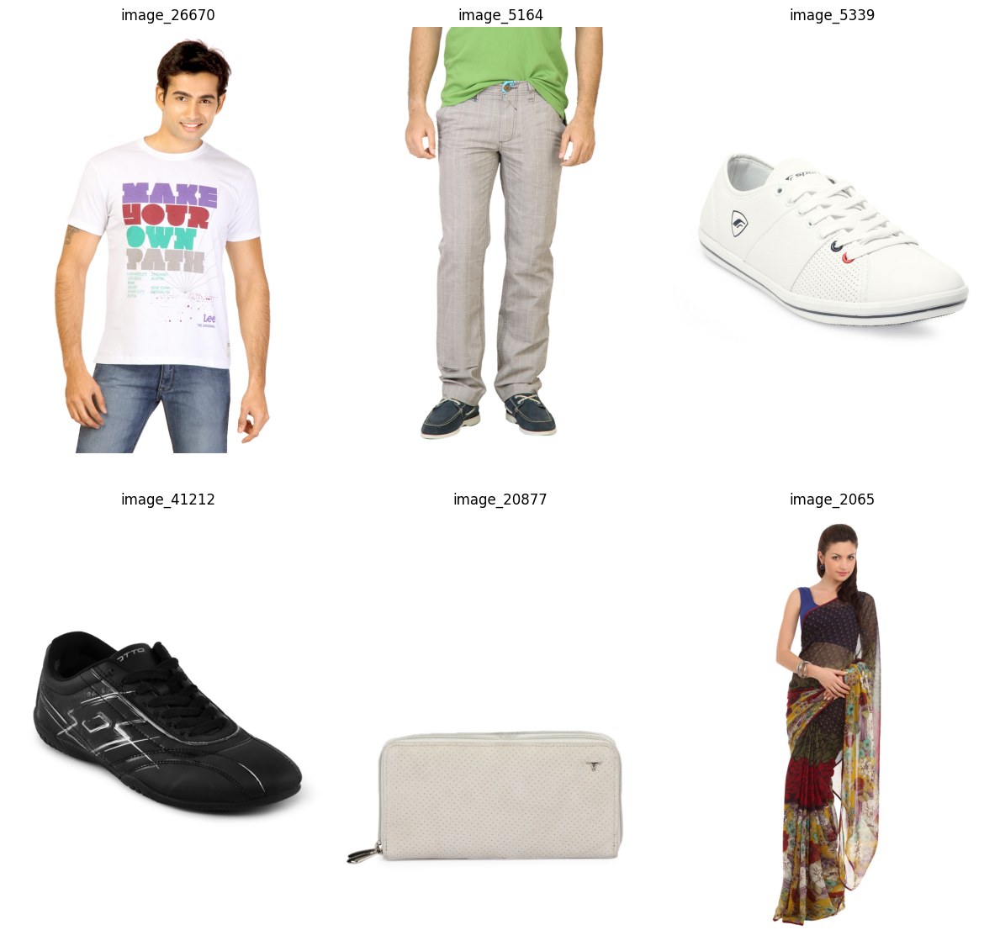

In [9]:
sample_images = {'image_' + str(i): load_image(row.image_path) for i, row in fashion_copy.sample(6).iterrows()}
display_images(sample_images, 2, 3)

In [10]:
fashion_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44424 entries, 0 to 44423
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  44424 non-null  int64  
 1   gender              44424 non-null  object 
 2   masterCategory      44424 non-null  object 
 3   subCategory         44424 non-null  object 
 4   articleType         44424 non-null  object 
 5   baseColour          44409 non-null  object 
 6   season              44403 non-null  object 
 7   year                44423 non-null  float64
 8   usage               44107 non-null  object 
 9   productDisplayName  44417 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 3.4+ MB


In [21]:
fashion_data.head()

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt


In [ ]:
fashion_data = fashion_data.drop(columns = ["id"])

In [12]:
def analyze_product_demand(data):
    plt.figure(figsize=(12, 6))
    data['product_type'].value_counts().plot(kind='bar', color='skyblue')
    plt.title('Product Type Demand')
    plt.xlabel('Product Type')
    plt.ylabel('Frequency')
    plt.show()

In [13]:
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [22]:
# Demand Analysis by Category
def demand_analysis(data):
    plt.figure(figsize=(10, 6))
    data['articleType'].value_counts().head(10).plot(kind='bar', color='skyblue')
    plt.title('Top 10 Most Popular Product Types')
    plt.xlabel('Product Type')
    plt.ylabel('Frequency')
    plt.show()

In [23]:
# Segmentation by Gender, Category, and Season
def segmentation_analysis(data):
    plt.figure(figsize=(12, 6))
    sns.countplot(data=data, x='masterCategory', hue='gender', palette='viridis')
    plt.title('Product Category Distribution by Gender')
    plt.xlabel('Category')
    plt.ylabel('Count')
    plt.legend(title='Gender')
    plt.show()
    
    plt.figure(figsize=(10, 6))
    sns.countplot(data=data, x='season', hue='gender', palette='plasma')
    plt.title('Seasonal Product Distribution by Gender')
    plt.xlabel('Season')
    plt.ylabel('Count')
    plt.legend(title='Gender')
    plt.show()

In [24]:
# Product Variability by Color and Season
def color_season_variability(data):
    plt.figure(figsize=(12, 6))
    sns.countplot(data=data, x='baseColour', hue='season', palette='coolwarm')
    plt.title('Product Color Variability by Season')
    plt.xlabel('Color')
    plt.ylabel('Count')
    plt.xticks(rotation=90)
    plt.legend(title='Season')
    plt.show()


* What are the most wanted products

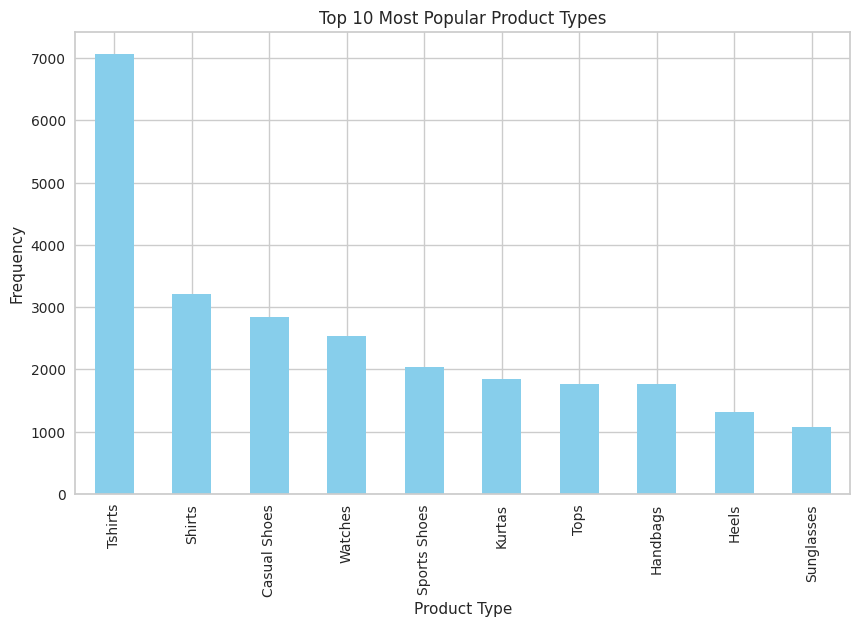

In [25]:
demand_analysis(fashion_data)

* How product and season varies according to gender

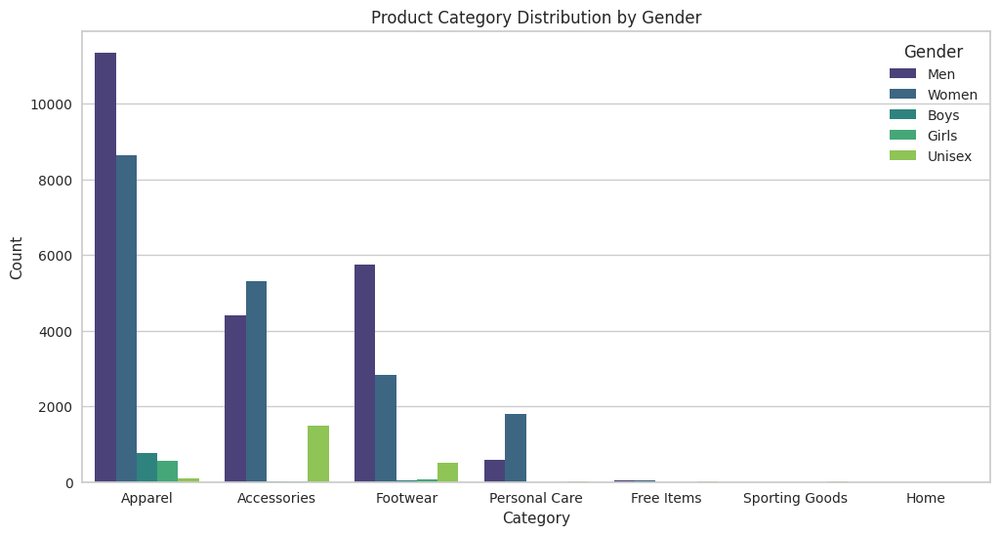

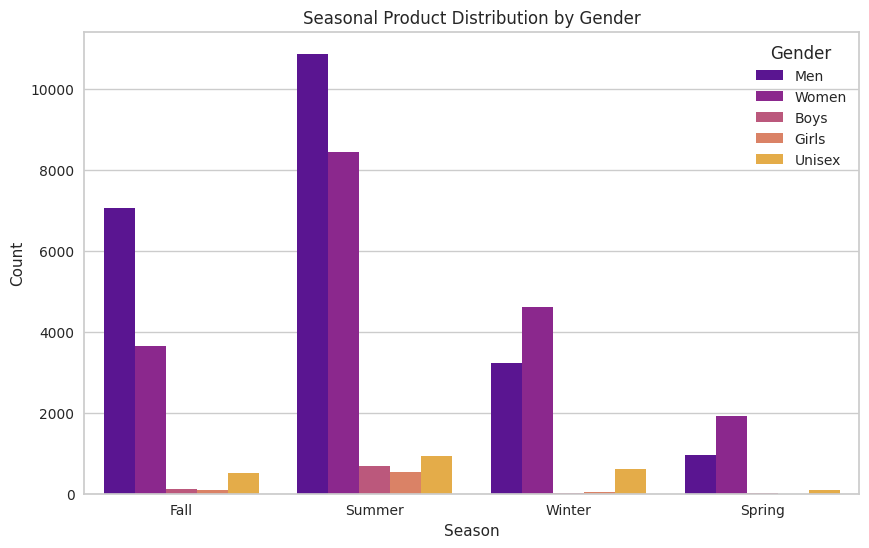

In [26]:
segmentation_analysis(fashion_data)

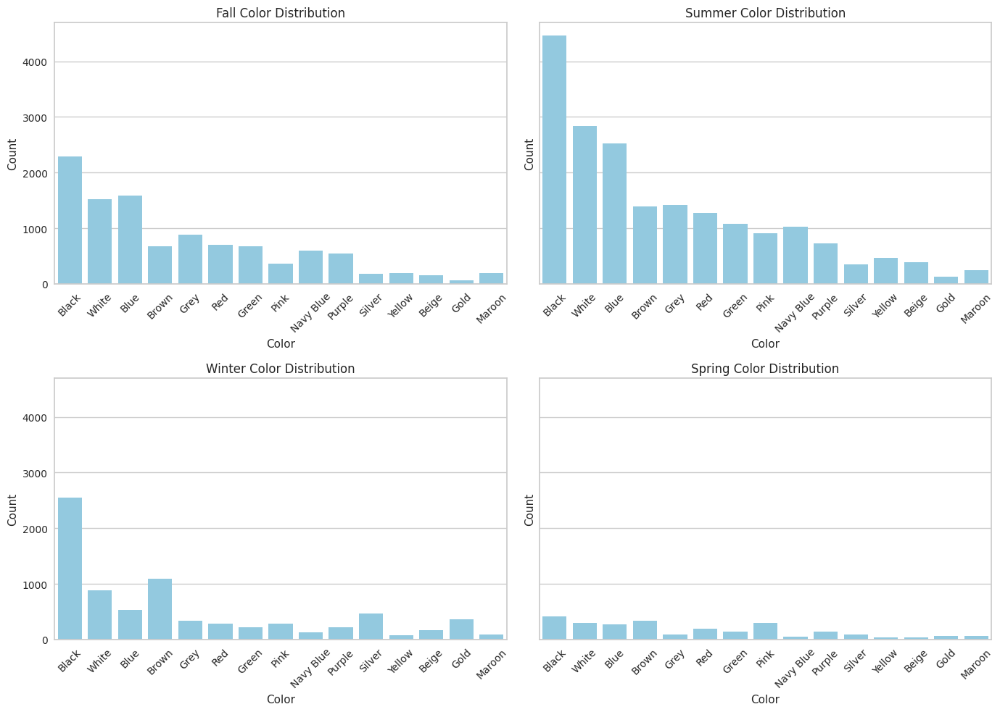

In [37]:
seasons = fashion_data['season'].dropna().unique()
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True)

for i, season in enumerate(seasons):
    ax = axes[i//2, i%2]
    sns.countplot(data=fashion_data[fashion_data['season'] == season], x='baseColour', order=top_colors, ax=ax, color='skyblue')
    ax.set_title(f'{season} Color Distribution')
    ax.set_xlabel('Color')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


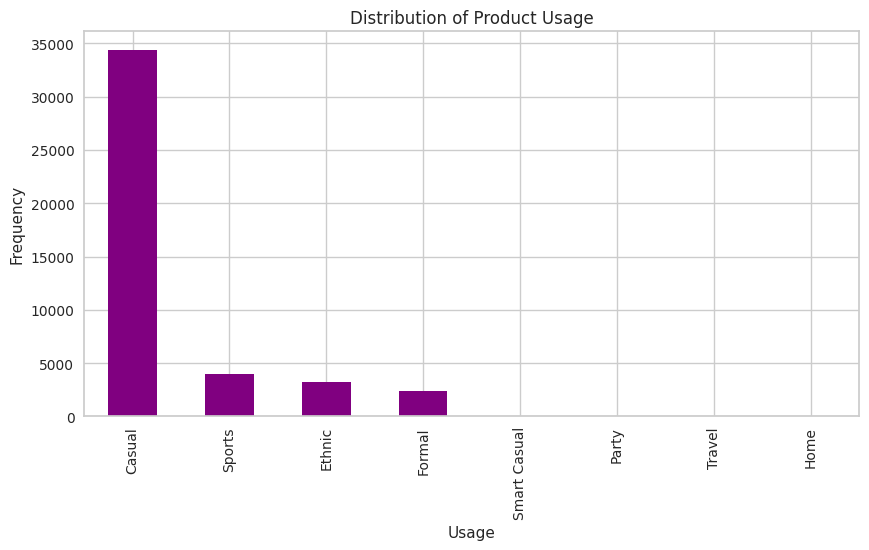

In [42]:
usage_counts = fashion_data['usage'].value_counts()
plt.figure(figsize=(10, 5))
usage_counts.plot(kind='bar', color='purple')
plt.title('Distribution of Product Usage')
plt.xlabel('Usage')
plt.ylabel('Frequency')
plt.show()


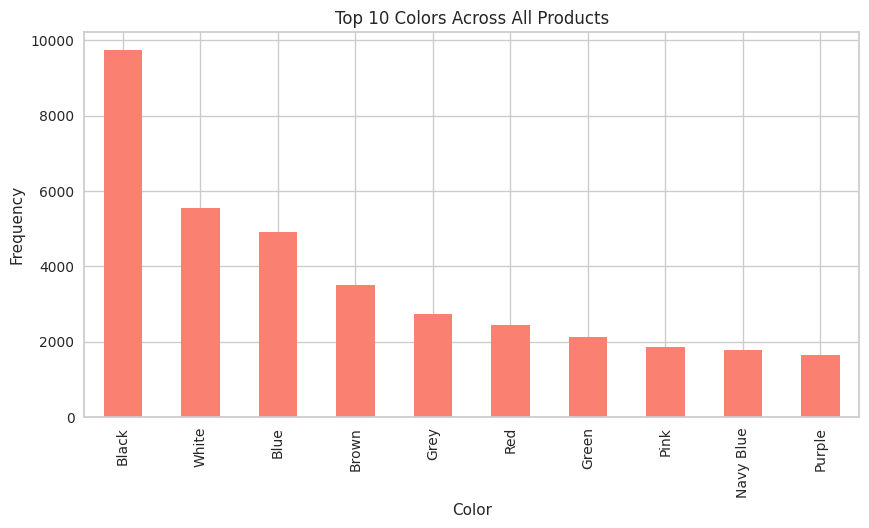

In [47]:
color_counts = fashion_data['baseColour'].value_counts().head(10)
plt.figure(figsize=(10, 5))
color_counts.plot(kind='bar', color='salmon')
plt.title('Top 10 Colors Across All Products')
plt.xlabel('Color')
plt.ylabel('Frequency')
plt.show()

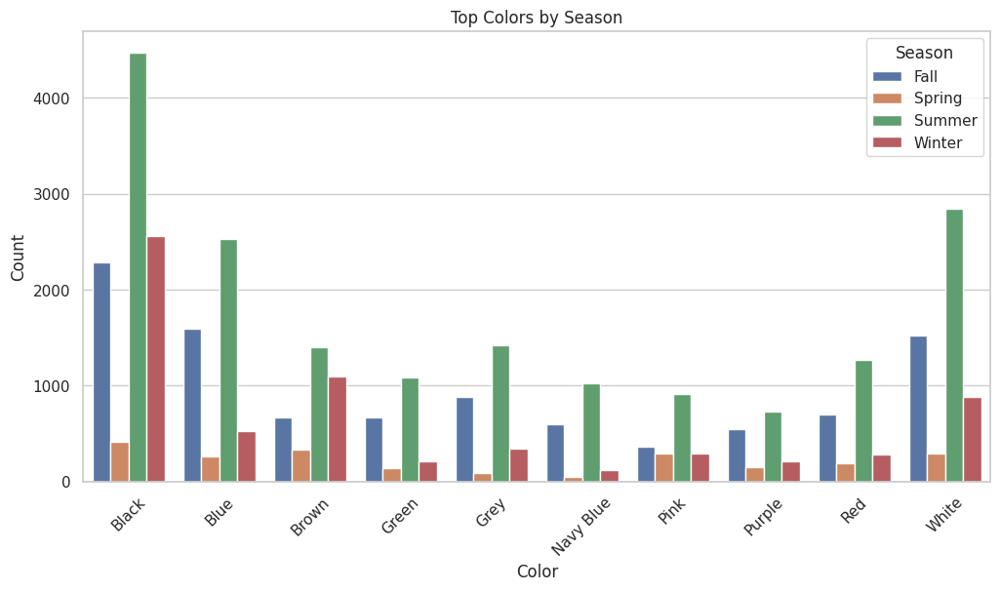

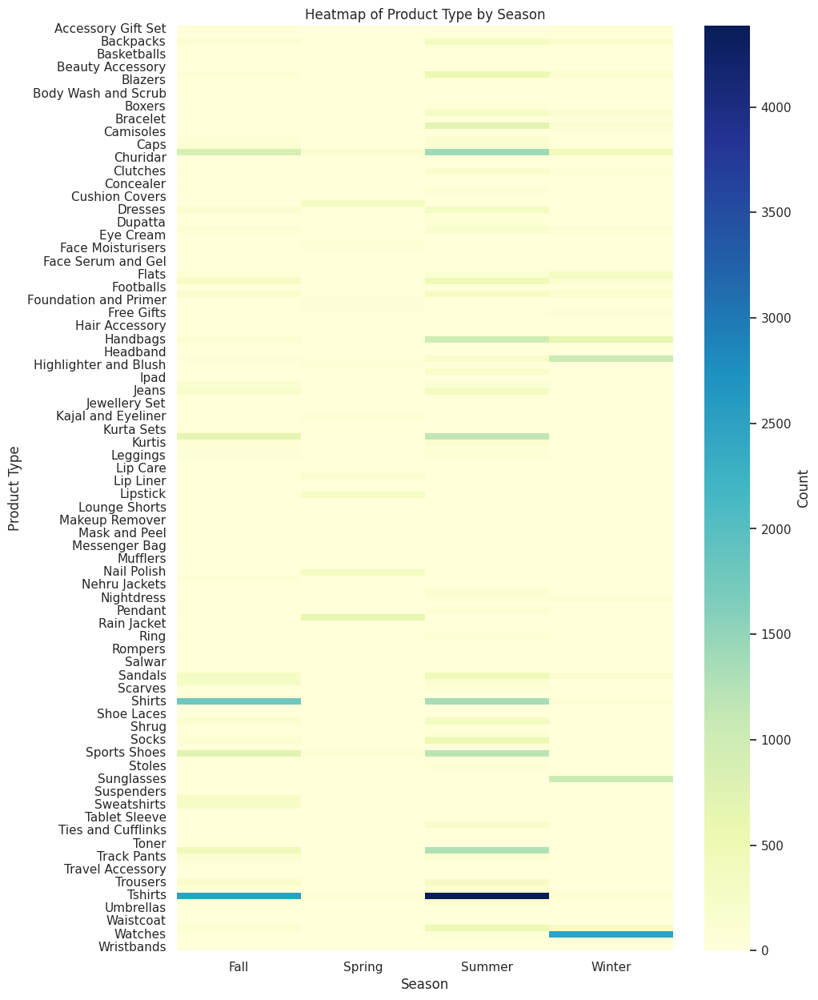

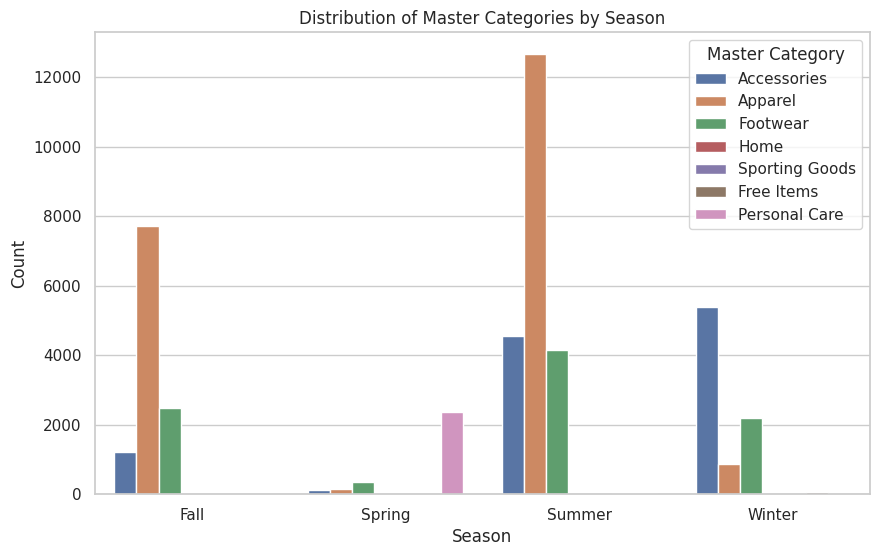

In [19]:
sns.set(style="whitegrid")

# Seasonal Trends for Colors (Top Colors Only)
top_colors = fashion_data['baseColour'].value_counts().head(10).index  # Top 10 colors overall
top_colors_by_season = fashion_data[fashion_data['baseColour'].isin(top_colors)].groupby(['season', 'baseColour']).size().reset_index(name='count')

plt.figure(figsize=(12, 6))
sns.barplot(data=top_colors_by_season, x='baseColour', y='count', hue='season')
plt.title('Top Colors by Season')
plt.xlabel('Color')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Season')
plt.show()

# Heatmap for Product Type vs. Season
product_season_pivot = fashion_data.pivot_table(index='articleType', columns='season', aggfunc='size', fill_value=0)
plt.figure(figsize=(10, 15))
sns.heatmap(product_season_pivot, cmap="YlGnBu", annot=False, cbar_kws={'label': 'Count'})
plt.title('Heatmap of Product Type by Season')
plt.xlabel('Season')
plt.ylabel('Product Type')
plt.show()

# Distribution of Master Categories by Season
category_season_counts = fashion_data.groupby(['season', 'masterCategory']).size().reset_index(name='count')

plt.figure(figsize=(10, 6))
sns.barplot(data=category_season_counts, x='season', y='count', hue='masterCategory')
plt.title('Distribution of Master Categories by Season')
plt.xlabel('Season')
plt.ylabel('Count')
plt.legend(title='Master Category')
plt.show()

# Insights

* Which product types are in highest demand during each season?

/tmp/ipykernel_30/721634438.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_product_types = season_product_count.groupby('season').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)


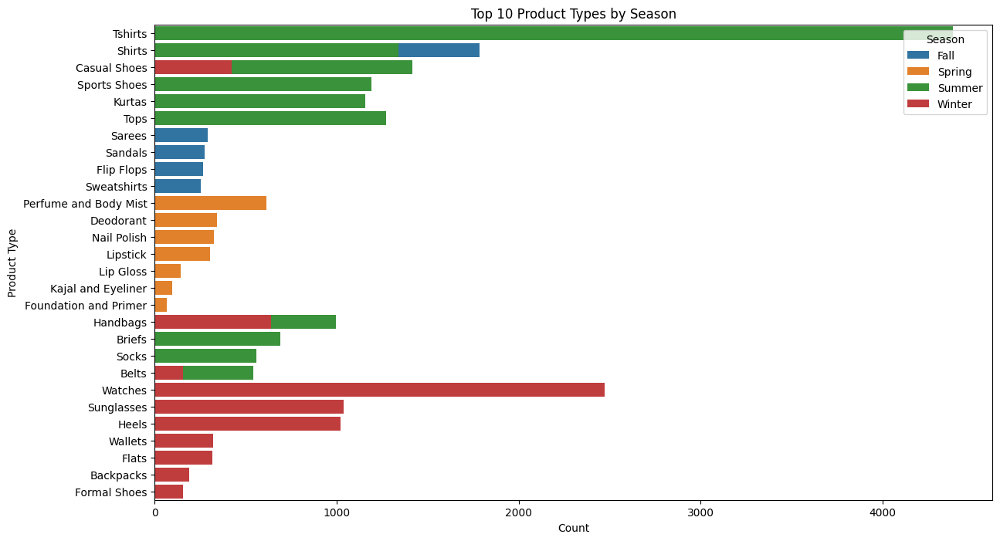

In [9]:
# Group by season and product type to count occurrences
season_product_count = fashion_data.groupby(['season', 'articleType']).size().reset_index(name='count')

# Get top 10 product types for each season
top_product_types = season_product_count.groupby('season').apply(lambda x: x.nlargest(10, 'count')).reset_index(drop=True)

plt.figure(figsize=(14, 8))
sns.barplot(data=top_product_types, x='count', y='articleType', hue='season', dodge=False)
plt.title('Top 10 Product Types by Season')
plt.xlabel('Count')
plt.ylabel('Product Type')
plt.legend(title='Season')
plt.show()

* What are the top colors in each season?

/tmp/ipykernel_30/1142232031.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_colors = season_color_count.groupby('season').apply(lambda x: x.nlargest(5, 'count')).reset_index(drop=True)


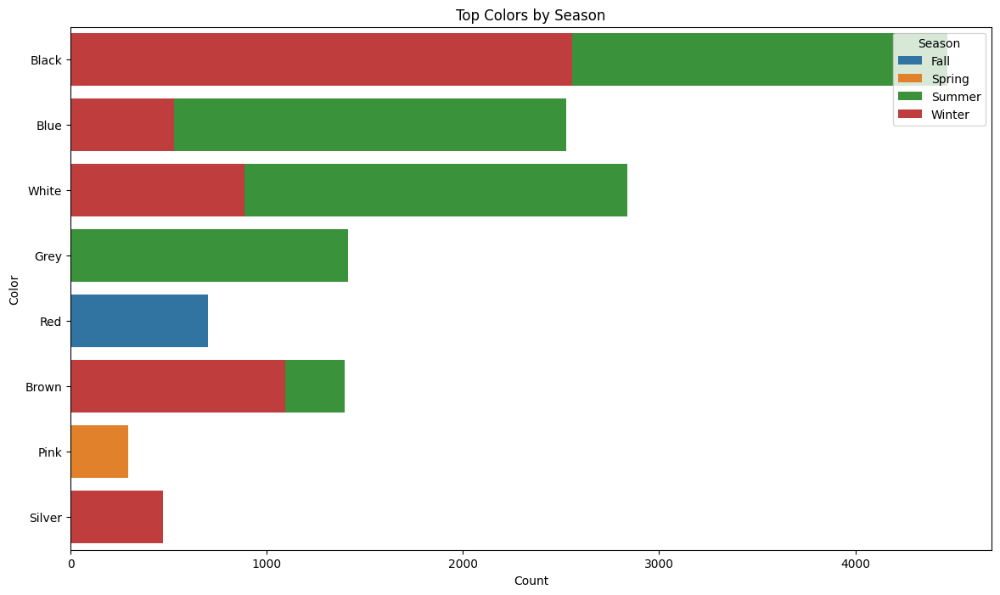

In [10]:
# Group by season and color to count occurrences
season_color_count = fashion_data.groupby(['season', 'baseColour']).size().reset_index(name='count')

# Get top colors for each season
top_colors = season_color_count.groupby('season').apply(lambda x: x.nlargest(5, 'count')).reset_index(drop=True)

plt.figure(figsize=(14, 8))
sns.barplot(data=top_colors, x='count', y='baseColour', hue='season', dodge=False)
plt.title('Top Colors by Season')
plt.xlabel('Count')
plt.ylabel('Color')
plt.legend(title='Season')
plt.show()


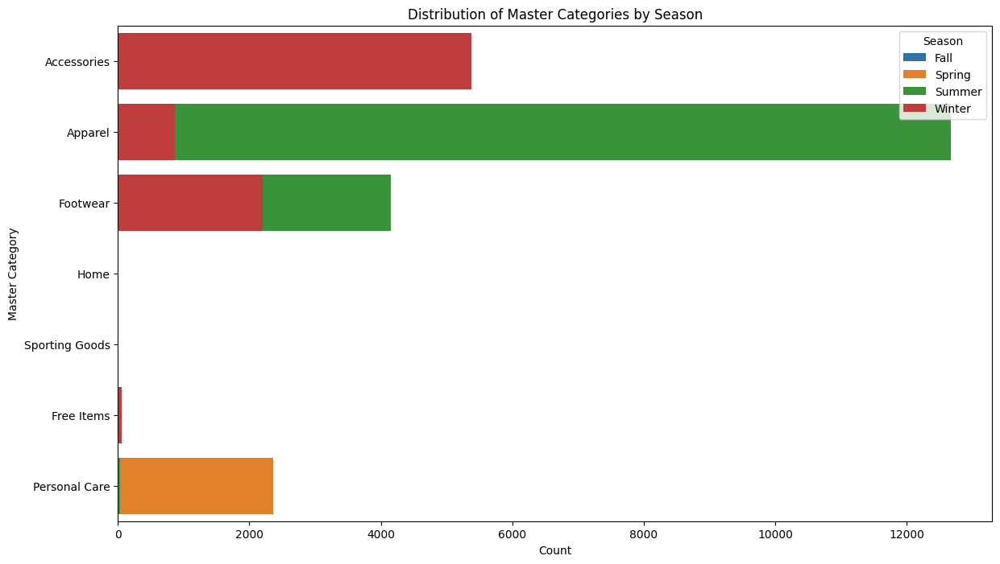

In [13]:
# Group by season and master category to count occurrences
season_master_category_count = fashion_data.groupby(['season', 'masterCategory']).size().reset_index(name='count')

plt.figure(figsize=(14, 8))
sns.barplot(data=season_master_category_count, x='count', y='masterCategory', hue='season', dodge=False)
plt.title('Distribution of Master Categories by Season')
plt.xlabel('Count')
plt.ylabel('Master Category')
plt.legend(title='Season')
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


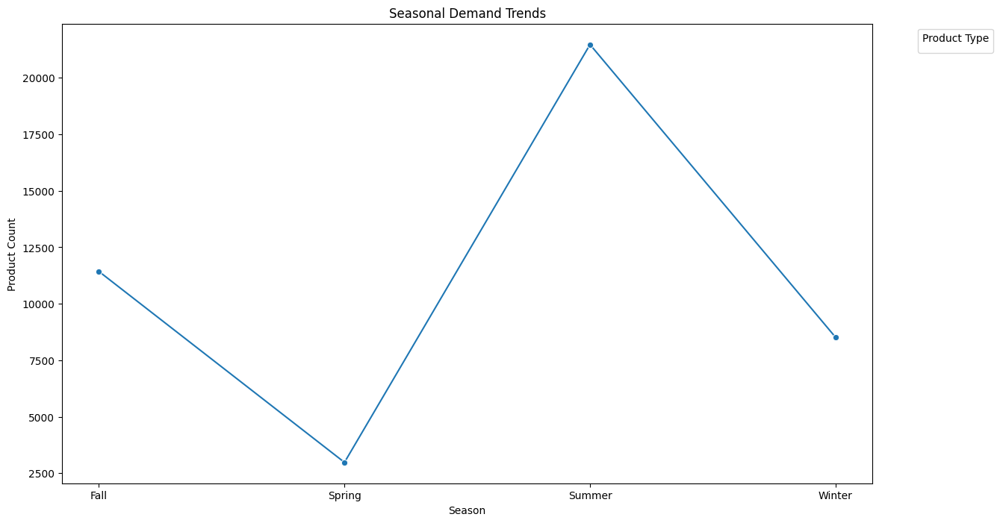

In [17]:
# We can calculate the product demand trend for each season and identify any inventory spikes or drops
seasonal_trends = fashion_data.groupby(['season']).size().reset_index(name='count')

# Seasonal trends plot
plt.figure(figsize=(14, 8))
sns.lineplot(data=seasonal_trends, x='season', y='count', marker='o')
plt.title('Seasonal Demand Trends')
plt.xlabel('Season')
plt.ylabel('Product Count')
plt.legend(title='Product Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

* How does the popularity of main product categories (like Apparel, Accessories, Footwear) vary by season?

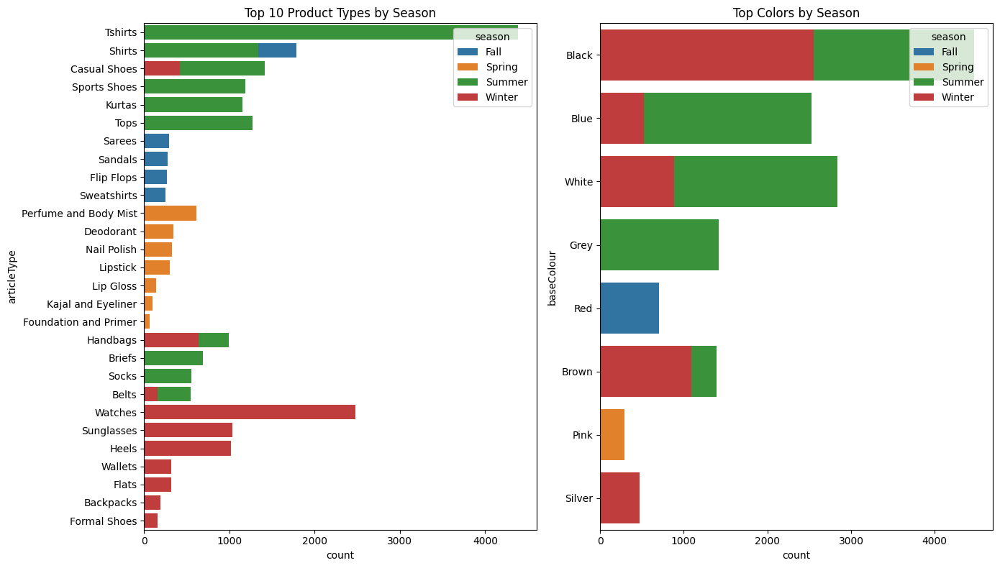

In [18]:
# Plot marketing opportunities: seasonal product type and color demand
plt.figure(figsize=(14, 8))

# Top product types by season
plt.subplot(1, 2, 1)
sns.barplot(data=top_product_types, x='count', y='articleType', hue='season', dodge=False)
plt.title('Top 10 Product Types by Season')

# Top colors by season
plt.subplot(1, 2, 2)
sns.barplot(data=top_colors, x='count', y='baseColour', hue='season', dodge=False)
plt.title('Top Colors by Season')

plt.tight_layout()
plt.show()

* For categories that have a seasonal downturn, reducing inventory in off-seasons can free up resources for high-demand categories.